# Multi-Layer Perceptrons and PyTorch

In this project, algorithms will be created to train non-linear models using multilayer perceptrons (MLPs) with PyTorch.

In all of the tasks below, PyTorch Lightning will be used to design, train and test MLP models.

<div class="alert alert-block alert-warning">
    
- **Section 1** :  Approximate the sine function.
- **Section 2** : Design a shallow MLP for the fashion MNIST
- **Section 3** : Comparing the performance of Shallow MLP vs Deep MLP.
    
</div>

## Section 1 : Approximate the sine function

In this section, the sine function will be approximated with a neural network to get a sense of how architecture and hyperparameters affect neural network performance.
<img src="./figures/sine_wave.gif" width="1200" align="center">

In [ ]:
# ! pip install --quiet "matplotlib" "pytorch-lightning" "pandas" "torchmetrics"
# ! pip install torchvision
import numpy as np
import random
import matplotlib.pyplot as plt

import pytorch_lightning as pl
import torch
import torch.nn as nn
import torchmetrics
from torchmetrics import Accuracy

# For reproducability
torch.manual_seed(1234)
random.seed(1234)
np.random.seed(1234)

# Define GPU number
GPU_indx = 0
device = torch.device(GPU_indx if torch.cuda.is_available() else 'cpu')
print(device)

cpu


In [ ]:
from torch import optim
from torch.utils.data import DataLoader
from torch.utils.data.dataset import Dataset

### 1.1 Creating a Pytorch dataset

The dataset will be points from a "noisy" sine wave. To create the custom dataset, using PyTorch dataset inbuilt functionalities. <br>


The Pytorch dataset class has three essential parts:<br>
1. The \__init__ function (as most Python classes do)<br>
2. The \__getitem__ function (this is called during every iteration)<br>
3. The \__len__ function (this must return the length of the dataset)

**The "self" within classes will become attributes of that class that use within other methods that are defined for that class. If defined an attribute without self.<\name>, then that attribute cannot be used for other methods.**

In [ ]:
# Create a "SineDataset" class by importing the Pytorch Dataset class

class SineDataset(Dataset):
    """ Data noisy sinewave dataset
        num_datapoints - the number of datapoints you want
    """
    def __init__(self, num_datapoints):

        # Create "num_datapoints" worth of random x points using a uniform distribution (0-1) using torch.rand
        # Then scale and shift the points to be between -9 and 9
        self.x_data = torch.rand(num_datapoints) * 18 - 9
        # Calculate the sin of all data points in the x vector and the scale amplitude
        # Scale the amplitude by diving by 2.5
        self.y_data = torch.sin(self.x_data) / 2.5

        # Add some Gaussein noise to each data point using torch.randn_like
        # Note: torch.randn_like will generate a tensor of Gaussein noise the same size and type as the provided tensor
        # Divide the randomly generated values by 20
        self.y_data += torch.randn_like(self.y_data) / 20

    def __getitem__(self, index):
        # This function is called by the dataLOADER class whenever it wants a new mini-batch
        # The dataLOADER class will pass the dataSET and number of datapoint indexes (mini-batch of indexes)
        # It is up to the dataSET's __getitem__ function to output the corresponding input datapoints and the corresponding labels
        return self.x_data[index], self.y_data[index]
        # Note:Pytorch will actually pass the __getitem__ function one index at a time

    def __len__(self):
        # Specify a "length" function, Python will use this fuction whenever
        # Define it so the dataLOADER knows how big the dataset is
        return self.x_data.shape[0]

### 1.2 Create instances from defined custom dataset and visualize the training dataset

In [ ]:
n_x_train = 30000   # the number of training datapoints
n_x_test = 8000     # the number of testing datapoints
BATCH_SIZE = 16     # the batch size for task 1

# Create an instance of the SineDataset for both the training and test set
dataset_train = SineDataset(n_x_train)
dataset_test  = SineDataset(n_x_test)

# batch_size - the size of the mini-batches
# shuffle - whether or not shuffle the dataset
# For training shuffle is set to True and for Testing/Validation shuffle is set to False
data_loader_train = DataLoader(dataset_train, batch_size=BATCH_SIZE, shuffle=True)
data_loader_test = DataLoader(dataset_test, batch_size=BATCH_SIZE, shuffle=False)

Text(0.5, 1.0, 'Training dataset visualization')

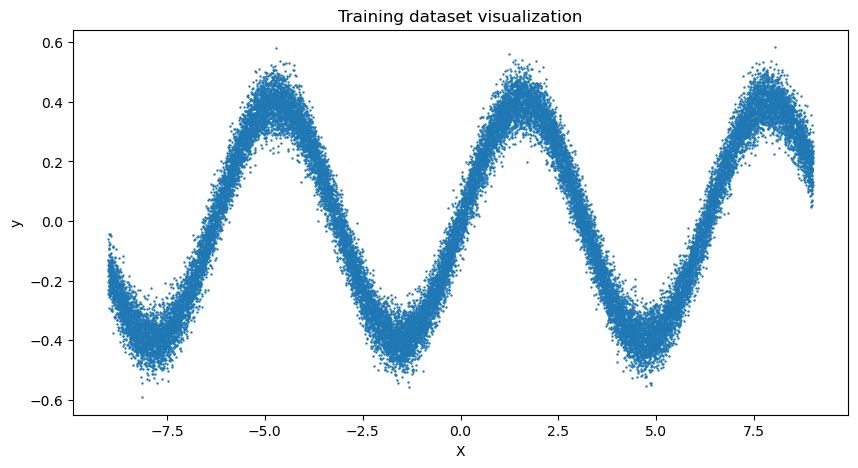

In [ ]:
# Visualize dataset using matplotlib scatter plot
fig1 = plt.figure(figsize=(10, 5))
plt.scatter(dataset_train.x_data, dataset_train.y_data, s=0.5)
plt.xlabel("X")
plt.ylabel("y")
plt.title("Training dataset visualization")

Text(0.5, 1.0, 'Test Dataset Visualization')

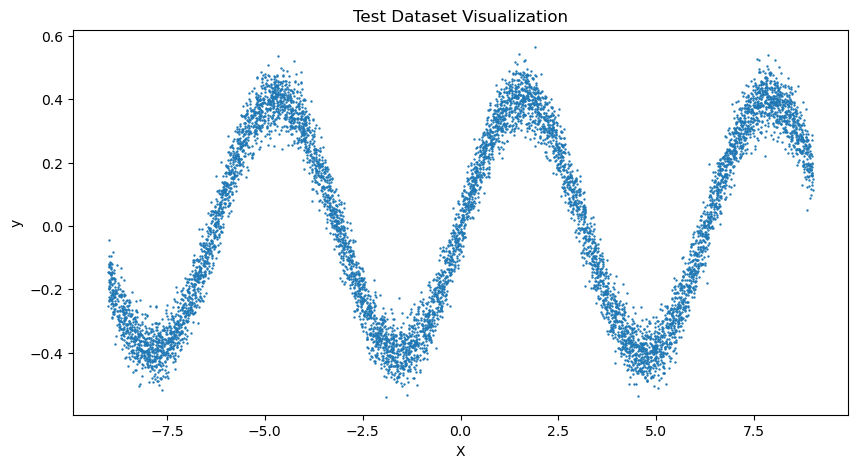

In [ ]:
fig2 = plt.figure(figsize=(10, 5))
plt.scatter(dataset_test.x_data, dataset_test.y_data, s=0.5)
plt.xlabel("X")
plt.ylabel("y")
plt.title("Test Dataset Visualization")

## Design a Neual Network and Train it

In [ ]:
import os
import pandas as pd

from IPython.display import display
from pytorch_lightning import LightningModule, Trainer
from pytorch_lightning.callbacks.progress import TQDMProgressBar
from pytorch_lightning.loggers import CSVLogger
from torch import nn
from torch.nn import functional as F
from torch.utils.data import DataLoader, random_split
from torchmetrics import Accuracy
from torchvision import transforms
from IPython.display import clear_output
from pytorch_lightning.callbacks import Callback, ModelCheckpoint

### 1.3 Design the Shallow Linear MLP model using PyTorch Lightning Module

Design a two layer Shallow MLP model and train it with both SGD and Adam optimizers.

In [ ]:
class ShallowLinear(LightningModule):
    def __init__(self, hidden_size=[1, 64, 1], learning_rate=1e-2, optimizer="SGD"):

        super().__init__()

        # Set the init args as class attributes
        self.learning_rate = learning_rate # Learning rate
        self.loss_fn = nn.MSELoss() # Use MSE loss as cost function
        self.optimizer = optimizer # Optimizer

        # Extract layer sizes from hidden_size list
        D_in, H, D_out = hidden_size[0], hidden_size[1], hidden_size[2]

        # Define the layers of the neural network
        self.linear1 = nn.Linear(D_in, H)  # Input to hidden layer
        self.linear2 = nn.Linear(H, D_out)  # Hidden to output layer

    def forward(self, x):
        # This function defines the "forward pass" of the neural network

        # Define the sqeuence of events for the forward pass
        x = x.view(x.size(0),1)
        x = self.linear1(x) # hidden layer
        x = torch.tanh(x) # activation function (tanh)

        # No activation function on the output
        x = self.linear2(x) # output layer

        return x

    def training_step(self, batch, batch_idx):
        # Write training step
        x, y = batch
        logits = self(x)
        logits = logits.squeeze(1)
        loss = self.loss_fn(logits,y)
        self.log("train_loss", loss, prog_bar=True, on_step=False, on_epoch=True)

        return loss

    def validation_step(self, batch, batch_idx):
        # Write validation step
        x, y = batch
        logits = self(x)
        logits = logits.squeeze(1)
        loss = self.loss_fn(logits,y)
        self.log("val_loss", loss, prog_bar=True, on_step=False, on_epoch=True)

        return loss

    def test_step(self, batch, batch_idx):
        # Write testing step
        x, y = batch
        logits = self(x)
        logits = logits.squeeze(1)
        loss = self.loss_fn(logits, y)
        self.log("test_loss", loss, prog_bar=True, on_step=False, on_epoch=True)

        return loss

    def predict_step(self, batch, batch_idx):
        # Write predict step
        x, y = batch
        return [x, self(x)]

    def configure_optimizers(self):
        if self.optimizer == "Adam":
            optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        else:
            optimizer = torch.optim.SGD(self.parameters(), lr=self.learning_rate)
        return optimizer

    def train_dataloader(self):
        return data_loader_train

    def val_dataloader(self):
        return data_loader_test

    def test_dataloader(self):
        return data_loader_test

### 1.4 Define training and testing methods for models
In this task, the model performance will be tested for both optimizers:
- SGD
- ADAM


In [ ]:
# Initialize Model with SGD optimizer
model_sgd = ShallowLinear()

# Train model for 20 epochs
trainer_task1_SGD = Trainer(
    accelerator="auto",
    max_epochs=20,
    callbacks=[TQDMProgressBar(refresh_rate=20)],
    logger=CSVLogger(save_dir="logs_task1_SGD/"),
)
trainer_task1_SGD.fit(model_sgd)

# Evaluate Model
trainer_task1_SGD.test(model_sgd)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name    | Type    | Params
------------------------------------
0 | loss_fn | MSELoss | 0     
1 | linear1 | Linear  | 128   
2 | linear2 | Linear  | 65    
------------------------------------
193       Trainable params
0         Non-trainable params
193       Total params
0.001     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:442: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 20 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:442: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 20 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=20` reached.
C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:442: PossibleUserWarning: The dataloader, test_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 20 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Runningstage.testing metric      DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_loss          0.009513421915471554
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.009513421915471554}]

In [ ]:
# Initialize Model with Adam optimizer
model_adam = ShallowLinear(optimizer="Adam")

# Train model for 20 epochs
trainer_task1_ADAM = Trainer(
    accelerator="auto",
    max_epochs=20,
    callbacks=[TQDMProgressBar(refresh_rate=20)],
    logger=CSVLogger(save_dir="logs_task1_Adam/"),
)
trainer_task1_ADAM.fit(model_adam)

# Evaluate Model
trainer_task1_ADAM.test(model_adam)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name    | Type    | Params
------------------------------------
0 | loss_fn | MSELoss | 0     
1 | linear1 | Linear  | 128   
2 | linear2 | Linear  | 65    
------------------------------------
193       Trainable params
0         Non-trainable params
193       Total params
0.001     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=20` reached.


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Runningstage.testing metric      DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_loss          0.004981930833309889
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.004981930833309889}]

### 1.5 Generate scatter plots for above two trained models to compare noisy datapoints and denoised predictions

C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:149: UserWarning: `.predict(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.predict(ckpt_path='best')` to use the best model or `.predict(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
  rank_zero_warn(
Restoring states from the checkpoint path at logs_task1_SGD/lightning_logs\version_2\checkpoints\epoch=19-step=37500.ckpt
Loaded model weights from the checkpoint at logs_task1_SGD/lightning_logs\version_2\checkpoints\epoch=19-step=37500.ckpt
C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:442: PossibleUserWarning: The dataloader, predict_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 20 which is the n

Predicting: 0it [00:00, ?it/s]

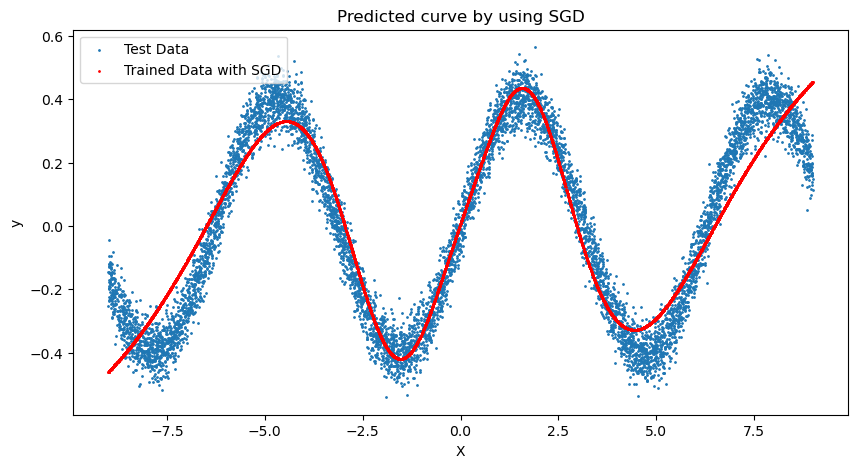

In [ ]:
# Scatter plot for models trained using SGD
predictions_sgd = trainer_task1_SGD.predict(dataloaders=data_loader_test)

fig1 = plt.figure(figsize=(10, 5))
plt.scatter(dataset_test.x_data, dataset_test.y_data, s=1)

for trained_dt in predictions_sgd:
    plt.scatter(trained_dt[0], trained_dt[1], s=1, c='r')

plt.xlabel("X")
plt.ylabel("y")
plt.title("Predicted curve by using SGD")
legend = plt.legend(["Test Data", "Trained Data with SGD"])

Restoring states from the checkpoint path at logs_task1_Adam/lightning_logs\version_1\checkpoints\epoch=19-step=37500.ckpt
Loaded model weights from the checkpoint at logs_task1_Adam/lightning_logs\version_1\checkpoints\epoch=19-step=37500.ckpt


Predicting: 0it [00:00, ?it/s]

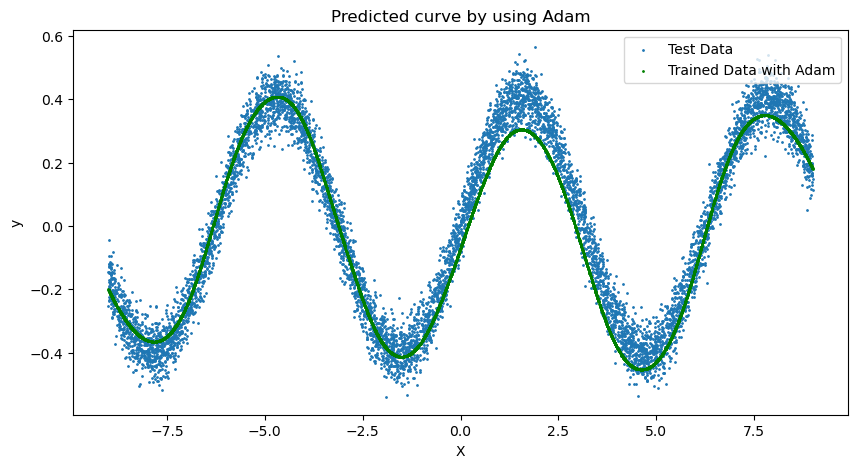

In [ ]:
# Scatter plot for model trained using Adam
predictions_adam = trainer_task1_ADAM.predict(dataloaders=data_loader_test)

fig2 = plt.figure(figsize=(10, 5))
plt.scatter(dataset_test.x_data, dataset_test.y_data, s=1)

for trained_dt in predictions_adam:
    plt.scatter(trained_dt[0], trained_dt[1], s=1, c='g')

plt.xlabel("X")
plt.ylabel("y")
plt.title("Predicted curve by using Adam")
legend = plt.legend(["Test Data", "Trained Data with Adam"])

### 1.6 Visualize experimental results
Using those logs, plot train losses for models trained on SGD and Adam.

Note: Make sure to drop NaN entries from dataframes before plotting by matplotlib and read the logs by using the pandas library (pd.read_csv)

In [ ]:
# read logs for model trained with SGD
training_loss_sgd = pd.read_csv(trainer_task1_SGD.logger.log_dir + "/metrics.csv")
training_loss_sgd = training_loss_sgd["train_loss"].dropna()

# read logs for model trained with Adam
training_loss_adam = pd.read_csv(trainer_task1_ADAM.logger.log_dir + "/metrics.csv")
training_loss_adam = training_loss_adam["train_loss"].dropna()

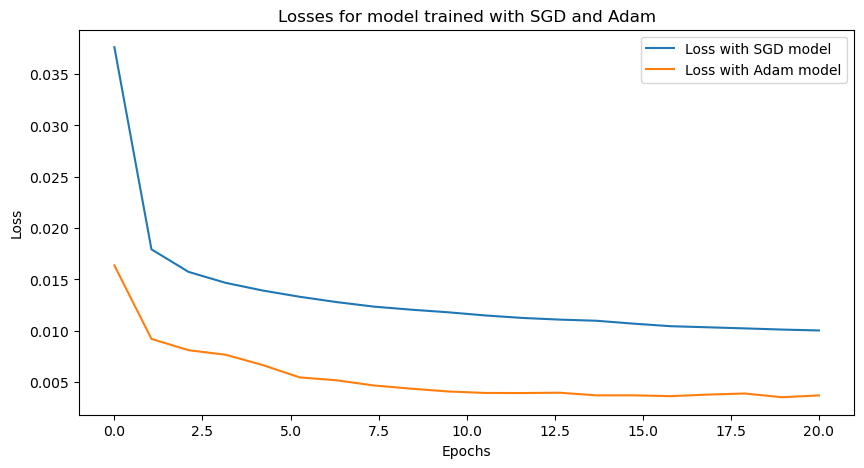

In [ ]:
# Visualize train losses for model trained with SGD and Adam
fig3 = plt.figure(figsize=(10, 5))
plt.plot(np.linspace(0, 20, len(training_loss_sgd)), training_loss_sgd)
plt.plot(np.linspace(0, 20, len(training_loss_adam)), training_loss_adam)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Losses for model trained with SGD and Adam")
legend = plt.legend(["Loss with SGD model", "Loss with Adam model"])

## Section 2 & 3 : Compare Shallow MLP and Deep MLP
In sections 2 and 3,  a Shallow MLPs and Deep MLPs will be trained for classifying images on the data file which is the Fashion-MNIST dataset that contains images and labels for training, validation and test purposes (The images are 28x28 grayscale images). The below figure A is a shallow neural network and B is a deep neural network.
<img src="figures/shallow_deep_mlp.png" width="1200" align="center">

### 2.1 Create custom dataloader

The following class reads the data for section 2 & 3 tasks and creates a torch dataset object for it.

In [ ]:
import torchvision

# For reproducability
torch.manual_seed(1234)
random.seed(1234)
np.random.seed(1234)

PATH_DATASETS = os.environ.get("PATH_DATASETS", ".")
BATCH_SIZE = 100

In [ ]:
class Section3Data(Dataset):
    def __init__(self, trn_val_tst):
        # Load numpy data
        data = np.load("fashion_mnist.npz") # Colleting the MNIST dataset from https://github.com/zalandoresearch/fashion-mnist
        if trn_val_tst == 0:
            # Create dataset for trainloader --> images arr_0, labels arr_1
            self.images = np.transpose(data["arr_0"])
            self.labels = data["arr_1"]
        elif trn_val_tst == 1:
            # Create dataset for valloader --> images arr_2, labels arr_3
            self.images = np.transpose(data["arr_2"])
            self.labels = data["arr_3"]
        else:
            # Create dataset for testloader --> images arr_4, labels arr_5
            self.images = np.transpose(data["arr_4"])
            self.labels = data["arr_5"]

        # Normalize images [0,1]
        self.images = (self.images - self.images.min())/(self.images.max() - self.images.min())

    # Define len function
    def __len__(self):
        return len(self.labels)

    # Define getitem function
    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        sample = self.images[idx,:]
        labels = self.labels[idx]
        return sample, labels

Now using dataset class create a dataloader for the section 3 data.

In [ ]:
# Call training dataset and create the trainloader
trainset = Section3Data(trn_val_tst=0)
trainloader = DataLoader(trainset, batch_size=BATCH_SIZE, shuffle=True)

# Call validation dataset and create the trainloader
valset = Section3Data(trn_val_tst=1)
valloader = DataLoader(valset, batch_size=BATCH_SIZE, shuffle=False)

# Call testing dataset and create the trainloader
testset = Section3Data(trn_val_tst=2)
testloader =DataLoader(testset, batch_size=BATCH_SIZE, shuffle=False)

### 2.2 Visualize dataset

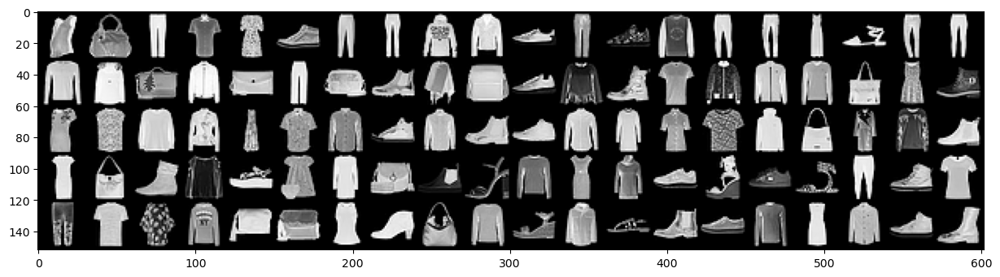

In [ ]:
# Create an iterater using the dataloaders and take a random sample
sample, labels = next(iter(trainloader))
sample = sample.reshape(100, 1, 28, 28)

# Visualize dataset using torchvision grid
fig4 = plt.figure(figsize = (15, 10))
out = torchvision.utils.make_grid(sample, 20)
plt.imshow(out.numpy().transpose((1, 2, 0)))

### 2.3 Design Shallow MLP

Design a Shallow MLP with one hidden linear layer.

In [ ]:
class Shallow_MLP(LightningModule):
    def __init__(self, n, num_classes, learning_rate=1e-1):
        super().__init__()

        self.learning_rate = learning_rate
        self.loss_fun = nn.CrossEntropyLoss() # Use CE loss

        self.linear1 = nn.Linear(784, n)
        self.linear2 = nn.Linear(n, 10)

        self.train_accuracy = Accuracy(num_classes=num_classes, task='multiclass')
        self.val_accuracy = Accuracy(num_classes=num_classes, task='multiclass')
        self.test_accuracy = Accuracy(num_classes=num_classes, task='multiclass')

    def forward(self, x):
        #Pass input through conv layers

        x = x.view(x.shape[0], -1)
        x = x.float()
        out1 = torch.tanh(self.linear1(x))
        out2 = self.linear2(out1)

        return out2

    def training_step(self, batch, batch_idx):
        # Write training step
        x, y = batch
        logits = self(x)
        loss = self.loss_fun(logits, y)

        preds = logits.argmax(1)
        self.train_accuracy.update(preds, y)

        self.log("train_loss", loss, prog_bar=True, on_step=False, on_epoch=True)
        self.log("train_acc", self.train_accuracy, prog_bar=True, on_step=False, on_epoch=True)
        return loss

    def validation_step(self, batch, batch_idx):
        # Write validation step
        x, y = batch
        logits = self(x)
        loss = self.loss_fun(logits, y)

        preds = logits.argmax(1)
        self.val_accuracy.update(preds, y)

        self.log("val_loss", loss, prog_bar=True, on_step=False, on_epoch=True)
        self.log("val_acc", self.val_accuracy, prog_bar=True, on_step=False, on_epoch=True)

    def test_step(self, batch, batch_idx):
        # Write testing step
        x, y = batch
        logits = self(x)
        loss = self.loss_fun(logits, y)

        preds = logits.argmax(1)
        self.test_accuracy.update(preds, y)

        self.log("test_loss", loss, prog_bar=True, on_step=False, on_epoch=True)
        self.log("test_acc", self.test_accuracy, prog_bar=True, on_step=False, on_epoch=True)

    def predict_step(self, batch, batch_idx):
        # Write predict step
        x, y = batch
        logits = self(x)
        preds = logits.argmax(1)
        return [preds, y]

    def configure_optimizers(self):
        optimizer = torch.optim.SGD(self.parameters(), lr=self.learning_rate)
        return optimizer

    def train_dataloader(self):
        return trainloader

    def val_dataloader(self):
        return valloader

    def test_dataloader(self):
        return testloader

### 2.4 Train and evaluate model's performance for following scenarios

a. fc1 : Linear(784 $\times$ 32) $\rightarrow$ ReLU $\rightarrow$ fc2 : Linear(32 $\times$ 10)

b. fc1 : Linear(784 $\times$ 128) $\rightarrow$ ReLU $\rightarrow$ fc2 : Linear(128 $\times$ 10)

c. fc1 : Linear(784 $\times$ 512) $\rightarrow$ ReLU $\rightarrow$ fc2 : Linear(512 $\times$ 10)

In [ ]:
# Initialize Shallow MLP model with n = 32
model = Shallow_MLP(n=32, num_classes=10)

# Define checkpoint callback function to save best model
checkpoint_callback_2a = ModelCheckpoint(
    monitor="val_acc",
    dirpath="logs_task_2a/",
    save_top_k=1,
    mode="max",
    every_n_epochs=1
)

# Train and test the model
trainer_2a = Trainer(
    accelerator="auto",
    max_epochs=100,
    callbacks=[TQDMProgressBar(refresh_rate=20), checkpoint_callback_2a],
    logger=CSVLogger(save_dir="logs_task_2a/"),
)
trainer_2a.fit(model)
trainer_2a.test()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:617: UserWarning: Checkpoint directory C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_2a exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")

  | Name           | Type               | Params
------------------------------------------------------
0 | loss_fun       | CrossEntropyLoss   | 0     
1 | linear1        | Linear             | 25.1 K
2 | linear2        | Linear             | 330   
3 | train_accuracy | MulticlassAccuracy | 0     
4 | val_accuracy   | MulticlassAccuracy | 0     
5 | test_accuracy  | MulticlassAccuracy | 0     
------------------------------------------------------
25.4 K    Trainable params
0         Non-trainable 

Sanity Checking: 0it [00:00, ?it/s]

C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:442: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 20 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:442: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 20 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=100` reached.
C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:149: UserWarning: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
  rank_zero_warn(
Restoring states from the checkpoint path at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_2a\epoch=55-step=4480.ckpt
Loaded model weights from the checkpoint at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_2a\epoch=55-step=4480.ckpt
C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:442: PossibleUserWarning: The dataloader, test_dataloader, does not hav

Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Runningstage.testing metric      DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8531166911125183
        test_loss           0.4176487922668457
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.4176487922668457, 'test_acc': 0.8531166911125183}]

In [ ]:
# Initialize Shallow MLP model with n = 128
model = Shallow_MLP(n=128, num_classes=10)

# Define checkpoint callback function to save best model
checkpoint_callback_2b = ModelCheckpoint(
    monitor="val_acc",
    dirpath="logs_task_2b/",
    save_top_k=1,
    mode="max",
    every_n_epochs=1
)

# Train and test the model
trainer_2b = Trainer(
    accelerator="auto",
    max_epochs=100,
    callbacks=[TQDMProgressBar(refresh_rate=20),checkpoint_callback_2b],
    logger=CSVLogger(save_dir="logs_task_2b/"),
)
trainer_2b.fit(model)
trainer_2b.test()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:617: UserWarning: Checkpoint directory C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_2b exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")

  | Name           | Type               | Params
------------------------------------------------------
0 | loss_fun       | CrossEntropyLoss   | 0     
1 | linear1        | Linear             | 100 K 
2 | linear2        | Linear             | 1.3 K 
3 | train_accuracy | MulticlassAccuracy | 0     
4 | val_accuracy   | MulticlassAccuracy | 0     
5 | test_accuracy  | MulticlassAccuracy | 0     
------------------------------------------------------
101 K     Trainable params
0         Non-trainable 

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=100` reached.
Restoring states from the checkpoint path at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_2b\epoch=56-step=4560.ckpt
Loaded model weights from the checkpoint at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_2b\epoch=56-step=4560.ckpt


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Runningstage.testing metric      DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc             0.848800003528595
        test_loss            0.436878502368927
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.436878502368927, 'test_acc': 0.848800003528595}]

In [ ]:
# Initialize Shallow MLP model with n = 512
model = Shallow_MLP(n=512, num_classes=10)

# Define checkpoint callback function to save best model
checkpoint_callback_2c = ModelCheckpoint(
    monitor="val_acc",
    dirpath="logs_task_2c/",
    save_top_k=1,
    mode="max",
    every_n_epochs=1
)

# Train and test the model
trainer_2c = Trainer(
    accelerator="auto",
    max_epochs=100,
    callbacks=[TQDMProgressBar(refresh_rate=20), checkpoint_callback_2c],
    logger=CSVLogger(save_dir="logs_task_2c/"),
)
trainer_2c.fit(model)
trainer_2c.test()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:617: UserWarning: Checkpoint directory C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_2c exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")

  | Name           | Type               | Params
------------------------------------------------------
0 | loss_fun       | CrossEntropyLoss   | 0     
1 | linear1        | Linear             | 401 K 
2 | linear2        | Linear             | 5.1 K 
3 | train_accuracy | MulticlassAccuracy | 0     
4 | val_accuracy   | MulticlassAccuracy | 0     
5 | test_accuracy  | MulticlassAccuracy | 0     
------------------------------------------------------
407 K     Trainable params
0         Non-trainable 

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=100` reached.
Restoring states from the checkpoint path at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_2c\epoch=91-step=7360.ckpt
Loaded model weights from the checkpoint at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_2c\epoch=91-step=7360.ckpt


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Runningstage.testing metric      DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8550333380699158
        test_loss           0.4446629285812378
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.4446629285812378, 'test_acc': 0.8550333380699158}]

### 2.5 Plot Training losses for the different shallow networks

In [ ]:
# read logs for 2a
training_data_2a = pd.read_csv(trainer_2a.logger.log_dir + "/metrics.csv")
training_loss_2a = training_data_2a["train_loss"].dropna()
val_acc_2a = training_data_2a["val_acc"].dropna()

# read logs for 2b
training_data_2b = pd.read_csv(trainer_2b.logger.log_dir + "/metrics.csv")
training_loss_2b = training_data_2b["train_loss"].dropna()
val_acc_2b = training_data_2b["val_acc"].dropna()

# read logs for 2c
training_data_2c = pd.read_csv(trainer_2c.logger.log_dir + "/metrics.csv")
training_loss_2c = training_data_2c["train_loss"].dropna()
val_acc_2c = training_data_2c["val_acc"].dropna()

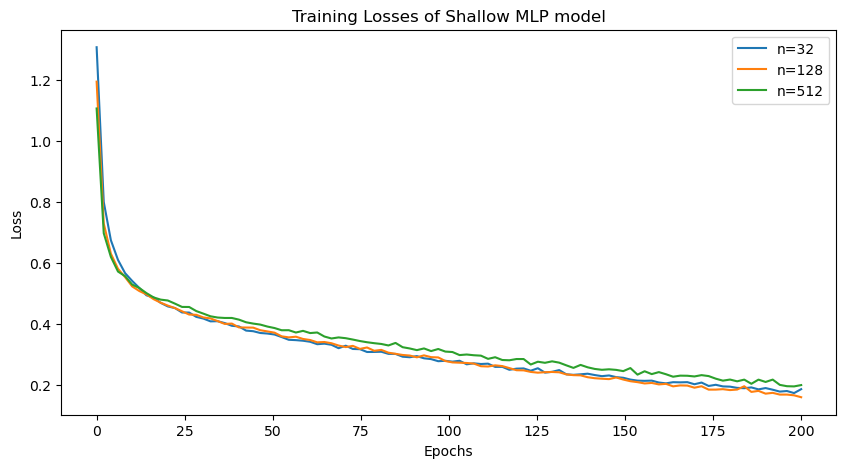

In [ ]:
# Plot training loss using matplotlib
fig5 = plt.figure(figsize=(10, 5))
plt.plot(np.linspace(0, 200, len(training_loss_2a)), training_loss_2a)
plt.plot(np.linspace(0, 200, len(training_loss_2b)), training_loss_2b)
plt.plot(np.linspace(0, 200, len(training_loss_2c)), training_loss_2c)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training Losses of Shallow MLP model")
legend = plt.legend(["n=32", "n=128", "n=512"])

# Discuss what you see
# The plots have a similar trend and there is a small gap among these three lines.

### 2.6 Plot Validation accuracies for the different shallow networks

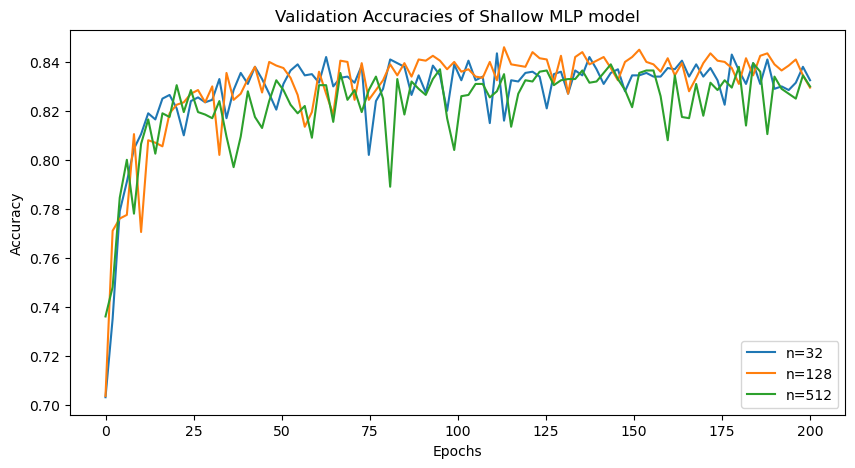

In [ ]:
# Plot validation accuracy using matplotlib
fig6 = plt.figure(figsize=(10, 5))
plt.plot(np.linspace(0, 200, len(val_acc_2a)), val_acc_2a)
plt.plot(np.linspace(0, 200, len(val_acc_2b)), val_acc_2b)
plt.plot(np.linspace(0, 200, len(val_acc_2c)), val_acc_2c)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Validation Accuracies of Shallow MLP model")
legend = plt.legend(["n=32", "n=128", "n=512"])


### 2.7 Visualize 5 predictions of test set along with groundtruths and input images for 3rd Shallow MLP

In [ ]:
# Generate predictions using predict function
predictions_2a = trainer_2a.predict(dataloaders=testloader)
predictions_2b = trainer_2b.predict(dataloaders=testloader)
predictions_2c = trainer_2c.predict(dataloaders=testloader)

C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:149: UserWarning: `.predict(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.predict(ckpt_path='best')` to use the best model or `.predict(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
  rank_zero_warn(
Restoring states from the checkpoint path at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_2a\epoch=55-step=4480.ckpt
Loaded model weights from the checkpoint at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_2a\epoch=55-step=4480.ckpt
C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:442: PossibleUserWarning: The dataloader, predict_dataloader, does not have many workers which may be a bottlen

Predicting: 0it [00:00, ?it/s]

Restoring states from the checkpoint path at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_2b\epoch=56-step=4560.ckpt
Loaded model weights from the checkpoint at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_2b\epoch=56-step=4560.ckpt


Predicting: 0it [00:00, ?it/s]

Restoring states from the checkpoint path at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_2c\epoch=91-step=7360.ckpt
Loaded model weights from the checkpoint at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_2c\epoch=91-step=7360.ckpt


Predicting: 0it [00:00, ?it/s]

In [ ]:
#  Create vis_preds function to visualize predictions
def vis_preds(testloader, predictions, scenario):
    test_data, test_labels = next(iter(testloader))
    im_idx = torch.randint(0, test_labels.shape[0], (8,))
    im_label = [predictions[0][0][i] for i in im_idx]
    im_pred = [predictions[0][1][i] for i in im_idx]
    fig, axs = plt.subplots(1, 8, figsize=(24, 3), sharey=True)
    for i, im_num in enumerate(im_idx):
        axs[i].imshow(test_data[im_num].resize(28,28))
        axs[i].set_title(f"Item {im_num}: label: {im_label[i]}, pred: {im_pred[i]}")
    fig.suptitle(f"Test Dataset Prediction Visualization for Scenario {scenario}")
    plt.show()

C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\torch\_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


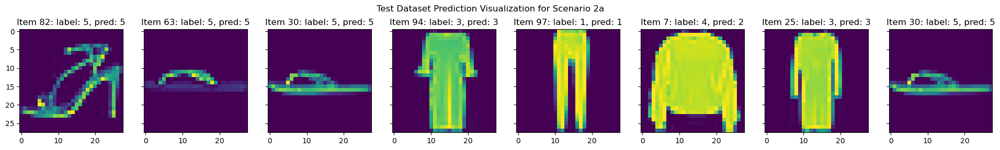

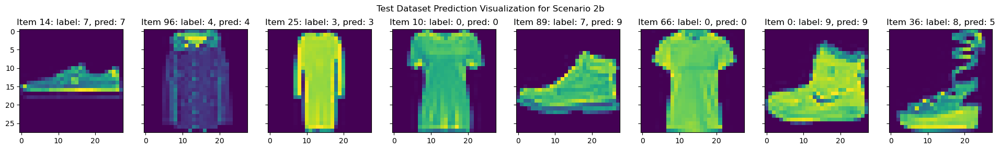

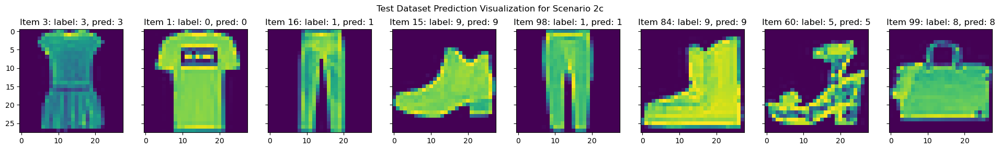

In [ ]:
# visualize predictions along with ground truths and input images using matplotlib
vis_preds(testloader, predictions_2a, "2a")
vis_preds(testloader, predictions_2b, "2b")
vis_preds(testloader, predictions_2c, "2c")

# Section 3: Deep MLP

### 3.1 Design Deep MLP

Design a Deep MLP with four linear layers.

In [ ]:
class Deep_MLP(LightningModule):
    def __init__(self, n1, n2, n3, num_classes, learning_rate=1e-1):
        super().__init__()

        self.learning_rate = learning_rate
        self.loss_fun = nn.CrossEntropyLoss() # Use CE loss

        self.linear1 = nn.Linear(784, n1)
        self.linear2 = nn.Linear(n1, n2)
        self.linear3 = nn.Linear(n2, n3)
        self.linear4 = nn.Linear(n3, 10)

        self.train_accuracy = Accuracy(num_classes=num_classes, task='multiclass')
        self.val_accuracy = Accuracy(num_classes=num_classes, task='multiclass')
        self.test_accuracy = Accuracy(num_classes=num_classes, task='multiclass')

    def forward(self, x):
        #Pass input through conv layers
        x = x.view(x.shape[0], -1)
        x = x.float()
        out1 = torch.tanh(self.linear1(x))
        out2 = torch.tanh(self.linear2(out1))
        out3 = torch.tanh(self.linear3(out2))
        out4 = self.linear4(out3)

        return out4

    def training_step(self, batch, batch_idx):
        # Write training step
        x, y = batch
        logits = self(x)
        loss = self.loss_fun(logits, y)

        preds = logits.argmax(1)
        self.train_accuracy.update(preds, y)
        self.log("train_loss", loss, prog_bar=True, on_step=False, on_epoch=True)
        self.log("train_acc", self.train_accuracy, prog_bar=True, on_step=False, on_epoch=True)

        return loss

    def validation_step(self, batch, batch_idx):
        # Write validation step
        x, y = batch
        logits = self(x)
        loss = self.loss_fun(logits, y)

        preds = logits.argmax(1)
        self.val_accuracy.update(preds, y)

        self.log("val_loss", loss, prog_bar=True, on_step=False, on_epoch=True)
        self.log("val_acc", self.val_accuracy, prog_bar=True, on_step=False, on_epoch=True)

    def test_step(self, batch, batch_idx):
        # Write testing step
        x, y = batch
        logits = self(x)
        loss = self.loss_fun(logits, y)

        preds = logits.argmax(1)
        self.test_accuracy.update(preds, y)

        self.log("test_loss", loss, prog_bar=True, on_step=False, on_epoch=True)
        self.log("test_acc", self.test_accuracy, prog_bar=True, on_step=False, on_epoch=True)

    def predict_step(self, batch, batch_idx):
        # Write predict step
        x, y = batch
        logits = self(x)
        preds = logits.argmax(1)
        return [preds, y]

    def configure_optimizers(self):
        optimizer = torch.optim.SGD(self.parameters(), lr=self.learning_rate)
        return optimizer

    def train_dataloader(self):
        return trainloader

    def val_dataloader(self):
        return valloader

    def test_dataloader(self):
        return testloader

### 3.2 Train and evaluate model's performance for following scenarios

a. fc1 : Linear(784 $\times$ 128) $\rightarrow$ ReLU $\rightarrow$ fc2 : Linear(128 $\times$ 64) $\rightarrow$ ReLU $\rightarrow$ fc3 : Linear(64 $\times$ 32) ->$\rightarrow$ Relu $\rightarrow$ fc4 : Linear(32 $\times$ 10)

b. fc1 : Linear(784 $\times$ 32) $\rightarrow$ ReLU $\rightarrow$ fc2 : Linear(32 $\times$ 64) $\rightarrow$ ReLU $\rightarrow$ fc3 : Linear(64 $\times$ 128) $\rightarrow$ Relu $\rightarrow$ fc4 : Linear(128 $\times$ 10)

c. fc1 : Linear(784 $\times$ 64) $\rightarrow$ ReLU $\rightarrow$ fc2 : Linear(64 $\times$ 64) $\rightarrow$ ReLU $\rightarrow$ fc3 : Linear(64 $\times$ 64) $\rightarrow$ Relu $\rightarrow$ fc4 : Linear(64 $\times$ 10)

Note: Make sure to have different log file directories (eg: logs_task_3a, logs_task_3b and logs_task_3c)

In [ ]:
# Initialize Deep MLP model for scenario 3a
model = Deep_MLP(n1=128, n2=64, n3=32, num_classes=10)

# Define checkpoint callback function to save best model
checkpoint_callback_3a = ModelCheckpoint(
    monitor="val_acc",
    dirpath="logs_task_3a/",
    save_top_k=1,
    mode="max",
    every_n_epochs=1
)

# Train and Test Model
trainer_3a = Trainer(
    accelerator="auto",
    max_epochs=100,
    callbacks=[TQDMProgressBar(refresh_rate=20), checkpoint_callback_3a],
    logger=CSVLogger(save_dir="logs_task_3a/"),
)
trainer_3a.fit(model)
trainer_3a.test()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:617: UserWarning: Checkpoint directory C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_3a exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")

  | Name           | Type               | Params
------------------------------------------------------
0 | loss_fun       | CrossEntropyLoss   | 0     
1 | linear1        | Linear             | 100 K 
2 | linear2        | Linear             | 8.3 K 
3 | linear3        | Linear             | 2.1 K 
4 | linear4        | Linear             | 330   
5 | train_accuracy | MulticlassAccuracy | 0     
6 | val_accuracy   | MulticlassAccuracy | 0     
7 | test_accuracy  | MulticlassAccuracy | 0     
--------

Sanity Checking: 0it [00:00, ?it/s]

C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:442: PossibleUserWarning: The dataloader, val_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 20 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:442: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 20 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=100` reached.
C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:149: UserWarning: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
  rank_zero_warn(
Restoring states from the checkpoint path at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_3a\epoch=71-step=5760.ckpt
Loaded model weights from the checkpoint at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_3a\epoch=71-step=5760.ckpt
C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:442: PossibleUserWarning: The dataloader, test_dataloader, does not hav

Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Runningstage.testing metric      DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8572166562080383
        test_loss           0.4369206130504608
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.4369206130504608, 'test_acc': 0.8572166562080383}]

In [ ]:
# Initialize Deep MLP model for scenario 3b
model = Deep_MLP(n1=32, n2=64, n3=128, num_classes=10)

# Define checkpoint callback function to save best model
checkpoint_callback_3b = ModelCheckpoint(
    monitor="val_acc",
    dirpath="logs_task_3b/",
    save_top_k=1,
    mode="max",
    every_n_epochs=1
)

# Train and Test Model
trainer_3b = Trainer(
    accelerator="auto",
    max_epochs=100,
    callbacks=[TQDMProgressBar(refresh_rate=20), checkpoint_callback_3b],
    logger=CSVLogger(save_dir="logs_task_3b/"),
)
trainer_3b.fit(model)
trainer_3b.test()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:617: UserWarning: Checkpoint directory C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_3b exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")

  | Name           | Type               | Params
------------------------------------------------------
0 | loss_fun       | CrossEntropyLoss   | 0     
1 | linear1        | Linear             | 25.1 K
2 | linear2        | Linear             | 2.1 K 
3 | linear3        | Linear             | 8.3 K 
4 | linear4        | Linear             | 1.3 K 
5 | train_accuracy | MulticlassAccuracy | 0     
6 | val_accuracy   | MulticlassAccuracy | 0     
7 | test_accuracy  | MulticlassAccuracy | 0     
--------

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=100` reached.
Restoring states from the checkpoint path at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_3b\epoch=50-step=4080.ckpt
Loaded model weights from the checkpoint at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_3b\epoch=50-step=4080.ckpt


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Runningstage.testing metric      DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8446833491325378
        test_loss           0.4678650498390198
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.4678650498390198, 'test_acc': 0.8446833491325378}]

In [ ]:
# Initialize Deep MLP model for scenario 3c
model = Deep_MLP(n1=64, n2=64, n3=64, num_classes=10)

# Define checkpoint callback function to save best model
checkpoint_callback_3c = ModelCheckpoint(
    monitor="val_acc",
    dirpath="logs_task_3c/",
    save_top_k=1,
    mode="max",
    every_n_epochs=1
)

# Train and Test Model
trainer_3c = Trainer(
    accelerator="auto",
    max_epochs=100,
    callbacks=[TQDMProgressBar(refresh_rate=20), checkpoint_callback_3c],
    logger=CSVLogger(save_dir="logs_task_3c/"),
)
trainer_3c.fit(model)
trainer_3c.test()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:617: UserWarning: Checkpoint directory C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_3c exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")

  | Name           | Type               | Params
------------------------------------------------------
0 | loss_fun       | CrossEntropyLoss   | 0     
1 | linear1        | Linear             | 50.2 K
2 | linear2        | Linear             | 4.2 K 
3 | linear3        | Linear             | 4.2 K 
4 | linear4        | Linear             | 650   
5 | train_accuracy | MulticlassAccuracy | 0     
6 | val_accuracy   | MulticlassAccuracy | 0     
7 | test_accuracy  | MulticlassAccuracy | 0     
--------

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

`Trainer.fit` stopped: `max_epochs=100` reached.
Restoring states from the checkpoint path at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_3c\epoch=26-step=2160.ckpt
Loaded model weights from the checkpoint at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_3c\epoch=26-step=2160.ckpt


Testing: 0it [00:00, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Runningstage.testing metric      DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8495833277702332
        test_loss           0.4294264018535614
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.4294264018535614, 'test_acc': 0.8495833277702332}]

### 3.3 Plot Training loss vs Validation loss for the different deep networks

In [ ]:
# read logs for 3a
training_data_3a = pd.read_csv(trainer_3a.logger.log_dir + "/metrics.csv")
training_loss_3a = training_data_3a["train_loss"].dropna()
val_loss_3a = training_data_3a["val_loss"].dropna()

# read logs for 3b
training_data_3b = pd.read_csv(trainer_3b.logger.log_dir + "/metrics.csv")
training_loss_3b = training_data_3b["train_loss"].dropna()
val_loss_3b = training_data_3b["val_loss"].dropna()

# read logs for 3c
training_data_3c = pd.read_csv(trainer_3c.logger.log_dir + "/metrics.csv")
training_loss_3c = training_data_3c["train_loss"].dropna()
val_loss_3c = training_data_3c["val_loss"].dropna()

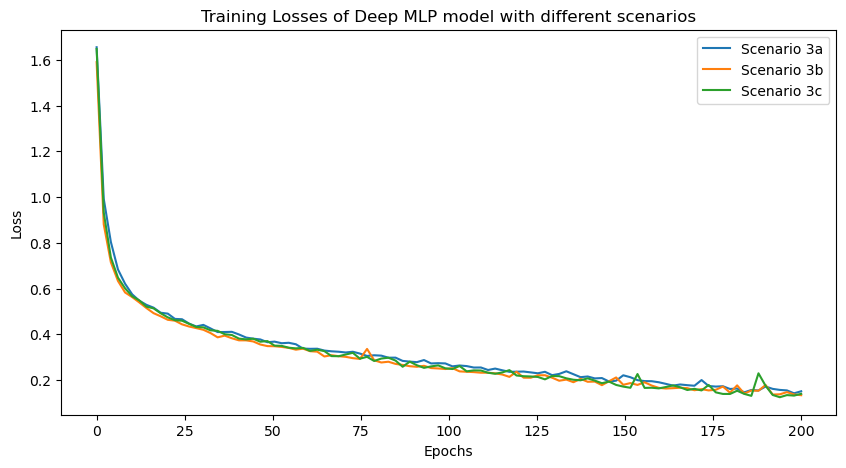

In [ ]:
# Plot training loss using matplotlib
fig7 = plt.figure(figsize=(10, 5))
plt.plot(np.linspace(0, 200, len(training_loss_3a)), training_loss_3a)
plt.plot(np.linspace(0, 200, len(training_loss_3b)), training_loss_3b)
plt.plot(np.linspace(0, 200, len(training_loss_3c)), training_loss_3c)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training Losses of Deep MLP model with different scenarios")
legend = plt.legend(["Scenario 3a", "Scenario 3b", "Scenario 3c"])

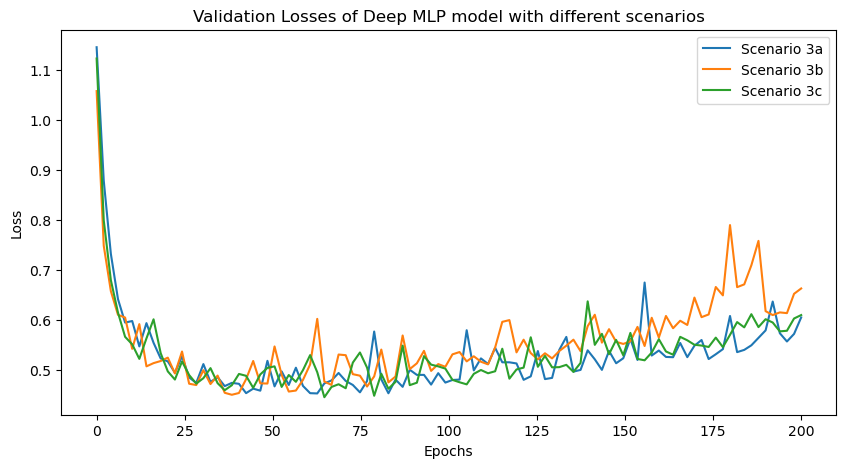

In [ ]:
# Plot validation loss using matplotlib, you can overlay the graphs.
fig8 = plt.figure(figsize=(10, 5))
plt.plot(np.linspace(0, 200, len(val_loss_3a)), val_loss_3a)
plt.plot(np.linspace(0, 200, len(val_loss_3b)), val_loss_3b)
plt.plot(np.linspace(0, 200, len(val_loss_3c)), val_loss_3c)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Validation Losses of Deep MLP model with different scenarios")
legend = plt.legend(["Scenario 3a", "Scenario 3b", "Scenario 3c"])

### 3.4 Visualize 5 predictions of test set along with groundtruths and input images for 3rd Deep MLP

In [ ]:
# Generate predictions using predict function
predictions_3a = trainer_3a.predict(dataloaders=testloader)
predictions_3b = trainer_3b.predict(dataloaders=testloader)
predictions_3c = trainer_3c.predict(dataloaders=testloader)

C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:149: UserWarning: `.predict(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.predict(ckpt_path='best')` to use the best model or `.predict(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
  rank_zero_warn(
Restoring states from the checkpoint path at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_3a\epoch=71-step=5760.ckpt
Loaded model weights from the checkpoint at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_3a\epoch=71-step=5760.ckpt
C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:442: PossibleUserWarning: The dataloader, predict_dataloader, does not have many workers which may be a bottlen

Predicting: 0it [00:00, ?it/s]

Restoring states from the checkpoint path at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_3b\epoch=50-step=4080.ckpt
Loaded model weights from the checkpoint at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_3b\epoch=50-step=4080.ckpt


Predicting: 0it [00:00, ?it/s]

Restoring states from the checkpoint path at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_3c\epoch=26-step=2160.ckpt
Loaded model weights from the checkpoint at C:\Users\Hongz\OneDrive\Desktop\Machine_Learning\Multi-Layer Perceptron and PyTorch\logs_task_3c\epoch=26-step=2160.ckpt


Predicting: 0it [00:00, ?it/s]

C:\Users\Hongz\AppData\Roaming\Python\Python311\site-packages\torch\_tensor.py:775: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


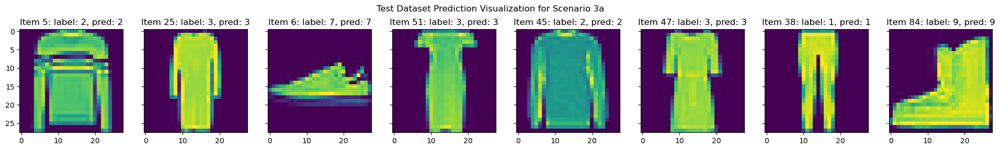

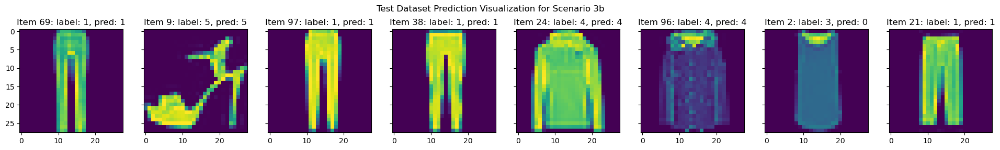

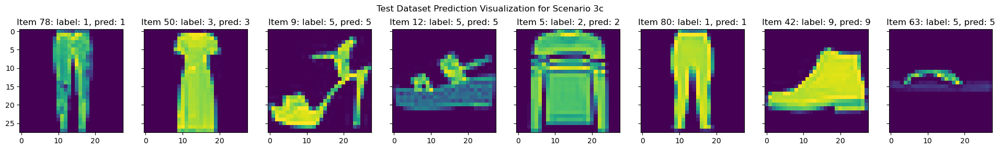

In [ ]:
# visualize predictions along with ground truths and input images using matplotlib
vis_preds(testloader, predictions_3a, "3a")
vis_preds(testloader, predictions_3b, "3b")
vis_preds(testloader, predictions_3c, "3c")